# Final Project - Computer Vision
---
**Objectives**  
This computer vision project aims to build a model to classify car damage into six class: crack, dent, glass shatter, lamp broken, scratch, tire flat.

# **Import Libraries**

In [1]:
# Define Libraries

import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from PIL import Image
import warnings

pd.options.display.max_columns = 200
warnings.filterwarnings('ignore')

# Feature Engineering
from sklearn.model_selection import train_test_split

# Model Evaluation
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

## **Data Loading**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Downloading the data from kaggle

! mkdir ~/.kaggle
! cp '/content/drive/MyDrive/BOOTCAMP/DATA SCIENCE - HACKTIV8/P2/kaggle.json' ~/.kaggle/
# ! chmod 600 '/Users/basyirasabita/.kaggle/kaggle.json'
! kaggle datasets download gauravduttakiit/vehicle-damage-identification

100% 1.49G/1.49G [00:17<00:00, 100MB/s] 
100% 1.49G/1.49G [00:17<00:00, 90.3MB/s]


In [2]:
! unzip -q ./vehicle-damage-identification.zip

replace sol/10000.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [3]:
# Loading the train files path
train_files = glob.glob('./train/*')

train_files

['./train/dent',
 './train/crack',
 './train/scratch',
 './train/lamp broken',
 './train/glass shatter',
 './train/tire flat']

We observes that there are 6 types of damages as seen in the directory.

In [4]:
# Loading the test files path
test_files = glob.glob('./test/*')

test_files

['./test/dent',
 './test/crack',
 './test/scratch',
 './test/lamp broken',
 './test/glass shatter',
 './test/tire flat']

In [5]:
# Defining the labels for classification
labels = []
for folder in train_files:
    label = folder.split('/')[2] # Split the path and slice the label name
    labels.append(label)

labels

['dent', 'crack', 'scratch', 'lamp broken', 'glass shatter', 'tire flat']

Now, we have list of the damages label derived from the directory.

In [6]:
# # Renaming the files by relevant labels
# for label in labels:
#     train_path = f'./train/{label}'
#     train_img_files = glob.glob(train_path + '/*')
#     num_train = 1
#     for img_file in train_img_files:
#       os.rename(img_file, f'{train_path}/{label}_' + "{:03d}".format(num_train) + '.jpg')
#       num_train += 1
#     print(f'last num_train of {label}: {num_train}')

#     test_path = f'./test/{label}'
#     test_img_files = glob.glob(test_path + '/*')
#     num_test = 1
#     for img_file in test_img_files:
#       os.rename(img_file, f'{test_path}/{label}_' + "{:03d}".format(num_test) + '.jpg')
#       num_test += 1
#     print(f'last num_test of {label}: {num_test}')

last num_train of dent: 1664
last num_test of dent: 417
last num_train of crack: 138
last num_test of crack: 35
last num_train of scratch: 1880
last num_test of scratch: 471
last num_train of lamp broken: 707
last num_test of lamp broken: 177
last num_train of glass shatter: 949
last num_test of glass shatter: 238
last num_train of tire flat: 428
last num_test of tire flat: 108


The images files are now renamed based on their labels. So, each file names are more descriptive.

In [7]:
# Listing train images of each category
train_files_dict = {}
all_train_files = []

for label in labels:
    train_path = f'./train/{label}'
    train_img_files = glob.glob(train_path + '/*')
    train_img_files.sort()
    train_files_dict[f'{label}_train_files'] = train_img_files
    all_train_files.extend(train_img_files)

print(f'len all train files: {len(all_train_files)}')
print(all_train_files[-6:])

len all train files: 5760
['./train/tire flat/tire flat_422.jpg', './train/tire flat/tire flat_423.jpg', './train/tire flat/tire flat_424.jpg', './train/tire flat/tire flat_425.jpg', './train/tire flat/tire flat_426.jpg', './train/tire flat/tire flat_427.jpg']


Now, we're saving all of the train files path as a dictionary.

In [8]:
# Listing test images of each category
test_files_dict = {}
all_test_files = []

for label in labels:
    test_path = f'./test/{label}'
    test_img_files = glob.glob(test_path + '/*')
    test_img_files.sort()
    test_files_dict[f'{label}_test_files'] = test_img_files
    all_test_files.extend(test_img_files)

print(f'len all test files: {len(all_test_files)}')
print(all_test_files[-6:])

len all test files: 1440
['./test/tire flat/tire flat_102.jpg', './test/tire flat/tire flat_103.jpg', './test/tire flat/tire flat_104.jpg', './test/tire flat/tire flat_105.jpg', './test/tire flat/tire flat_106.jpg', './test/tire flat/tire flat_107.jpg']


Now, we're saving all of the test files path as a dictionary.

In [9]:
# Create a Pandas DataFrame that contains the path of all train images
all_labels = []
for label in labels:
    train_files = train_files_dict[f'{label}_train_files']
    temp = [f'{label}' for i in range(len(train_files))]
    all_labels.extend(temp)

train_img_df = pd.DataFrame({
    'images':all_train_files, 'label':all_labels
})

train_img_df

,images,label
0,./train/dent/dent_001.jpg,dent
1,./train/dent/dent_002.jpg,dent
2,./train/dent/dent_003.jpg,dent
3,./train/dent/dent_004.jpg,dent
4,./train/dent/dent_005.jpg,dent
...,...,...
5755,./train/tire flat/tire flat_423.jpg,tire flat
5756,./train/tire flat/tire flat_424.jpg,tire flat
5757,./train/tire flat/tire flat_425.jpg,tire flat
5758,./train/tire flat/tire flat_426.jpg,tire flat


Now, we successfully save the train file path and its corresponding label into train_img_df.

In [10]:
# Create a Pandas DataFrame that contains the path of all test images
all_labels = []
for label in labels:
    test_files = test_files_dict[f'{label}_test_files']
    temp = [f'{label}' for i in range(len(test_files))]
    all_labels.extend(temp)

test_img_df = pd.DataFrame({
    'images':all_test_files, 'label':all_labels
})

test_img_df

,images,label
0,./test/dent/dent_001.jpg,dent
1,./test/dent/dent_002.jpg,dent
2,./test/dent/dent_003.jpg,dent
3,./test/dent/dent_004.jpg,dent
4,./test/dent/dent_005.jpg,dent
...,...,...
1435,./test/tire flat/tire flat_103.jpg,tire flat
1436,./test/tire flat/tire flat_104.jpg,tire flat
1437,./test/tire flat/tire flat_105.jpg,tire flat
1438,./test/tire flat/tire flat_106.jpg,tire flat


Now, we successfully save the test file path and its corresponding label into test_img_df.

# **Exploratory Data Analysis**

## EDA Functions

In [13]:
# Function to plot numeric distribution (histogram & boxplot)
def plot_distribution(df, col, colName, color = 'indianred'):
    plt.figure(figsize=(7,3))

    # Plot Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(data=df[col], kde=True, color=color, bins=20)
    plt.title('Histogram')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(data=df, x=col, color=color)
    plt.title('Boxplot')

    plt.suptitle(f'{colName} Distribution')
    plt.show()

In [14]:
# Function to get the label and its count
def label_proportion(df):
    label_count = df.groupby('label')['label'].count().sort_values(ascending=False)

    labels = label_count.index.to_list()
    counts = label_count.to_list()

    return labels, counts

## Label Proportion

In [15]:
# Get label proportion of image dataframe
labels, counts = label_proportion(train_img_df)

# Save the label and counts into Dataframe
label_df = pd.DataFrame({
    'label': labels,
    'count': counts
})

label_df

,label,count
0,scratch,1879
1,dent,1663
2,glass shatter,948
3,lamp broken,706
4,tire flat,427
5,crack,137


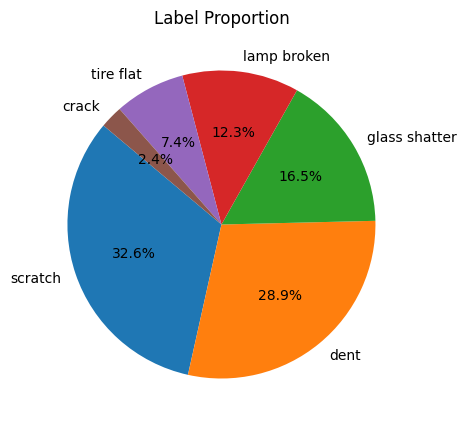

In [16]:
# Piechart
plt.figure(figsize=(5,5))
plt.pie(label_df['count'], labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('Label Proportion')

plt.show()

We observe an imbalance in the label distribution, with the largest proportion attributed to 'scratch' at 32.6% and the smallest to 'crack' at 2.4%. The considerable disparity between the largest and smallest proportions indicates the imbalance within the dataset. While accuracy may suffice as a metric during model fitting, we prioritize the use of the F1 score as our primary metric. F1 score offers a balanced evaluation, especially in scenarios with imbalanced classes, providing a comprehensive assessment of model performance.

## Image Sizes

In [17]:
# Get all file size in kb
all_file_sizes = []
for label in labels:
    files = train_files_dict[f'{label}_train_files']

    for i in range(len(files)):
        temp_path = files[i]
        size = os.path.getsize(temp_path) / 1024 # bytes to kb
        all_file_sizes.append(round(size,3))

# Save the file sizes to the image dataframe
train_img_df['size_kb'] = all_file_sizes

train_img_df

,images,label,size_kb
0,./train/crack/crack_001.jpg,crack,56.897
1,./train/crack/crack_002.jpg,crack,87.618
2,./train/crack/crack_003.jpg,crack,99.525
3,./train/crack/crack_004.jpg,crack,68.276
4,./train/crack/crack_005.jpg,crack,53.436
...,...,...,...
5755,./train/dent/dent_995.jpg,dent,79.294
5756,./train/dent/dent_996.jpg,dent,95.830
5757,./train/dent/dent_997.jpg,dent,385.609
5758,./train/dent/dent_998.jpg,dent,72.822


We've successfully saved the sizes of each image in the dataframe.

In [18]:
# Describing the size columns
train_img_df.describe()

,size_kb
count,5760.000000
mean,129.991642
std,67.843720
min,37.812000
25%,79.783500
50%,113.270000
75%,155.451750
max,430.297000


We observe that the average size of all the images is 129.992 kb. The maximum size of all the images is 430.297 kb, and the minimum size of all images is 37.812 kb. The difference between the maximum and minimum sizes is quite extensive. Therefore, we need to see the differences between the small and large images.

### Image Size Distribution

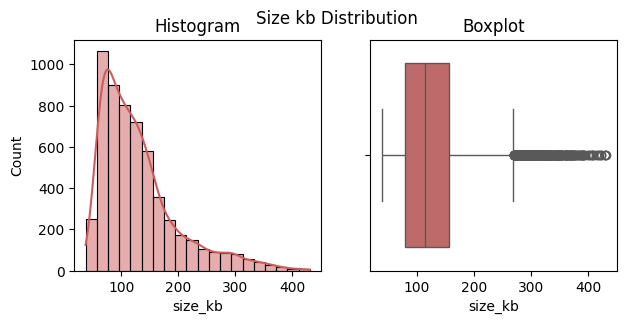

In [19]:
plot_distribution(train_img_df, 'size_kb', 'Size kb')

As seen in the visualization, the size of the images follows a skewed distribution, with several images having significantly larger sizes compared to the overall distribution. The majority of images fall within a size range lower than 300 kb.

### Display Small Images

In [20]:
small_train_img_df = train_img_df[train_img_df['size_kb'] <= 50]
small_train_img_df = small_train_img_df.sample(len(small_train_img_df)).reset_index(drop=True).head(5)

small_train_img_df

,images,label,size_kb
0,./train/tire flat/tire flat_349.jpg,tire flat,42.300
1,./train/scratch/scratch_1634.jpg,scratch,46.423
2,./train/glass shatter/glass shatter_636.jpg,glass shatter,43.395
3,./train/glass shatter/glass shatter_761.jpg,glass shatter,46.867
4,./train/scratch/scratch_1802.jpg,scratch,49.218


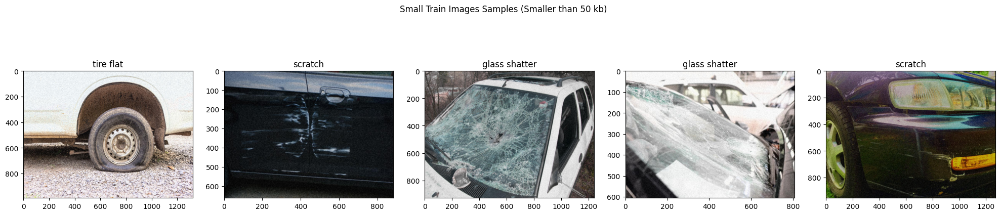

In [21]:
# Define the subplots for displaying images
fig, axes = plt.subplots(ncols=5, nrows= 1, figsize=(20,5))

# Saving the data to list
small_train_files = small_train_img_df['images'].to_list()
small_train_file_labels = small_train_img_df['label'].to_list()

# Iterate for every axes
for i in range(5):
    img = plt.imread(small_train_files[i])
    axes[i].imshow(img)
    axes[i].set_title(small_train_file_labels[i])

# Property of the plots
fig.suptitle('Small Train Images Samples (Smaller than 50 kb)')
fig.tight_layout()
plt.show()

We can see that there are no specific characteristics evident in the small images. From this, we can infer that the smaller size simply indicates lower resolution rather than any particular distinct features.

### Display Large Images

In [22]:
large_train_img_df = train_img_df[train_img_df['size_kb'] >= 400]
large_train_img_df = large_train_img_df.sample(len(large_train_img_df)).reset_index(drop=True).head(5)

large_train_img_df

,images,label,size_kb
0,./train/glass shatter/glass shatter_034.jpg,glass shatter,428.884
1,./train/scratch/scratch_1341.jpg,scratch,422.167
2,./train/dent/dent_458.jpg,dent,421.680
3,./train/scratch/scratch_1065.jpg,scratch,419.021
4,./train/dent/dent_1235.jpg,dent,406.505


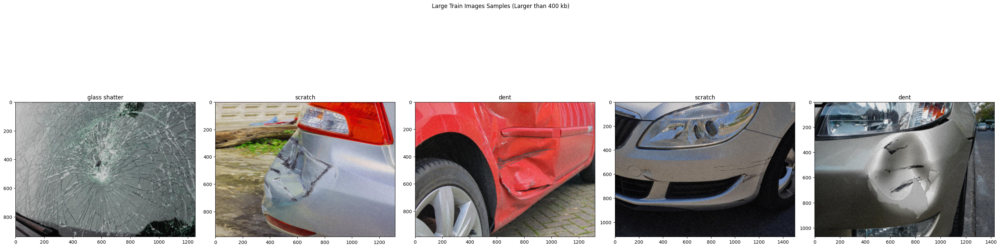

In [23]:
# Define the subplots for displaying images
fig, axes = plt.subplots(ncols=5, nrows= 1, figsize=(30,10))

# Saving the data to list
large_train_files = large_train_img_df['images'].to_list()
large_train_file_labels = large_train_img_df['label'].to_list()

# Iterate for every axes
for i in range(5):
    img = plt.imread(large_train_files[i])
    axes[i].imshow(img)
    axes[i].set_title(large_train_file_labels[i])

# Property of the plots
fig.suptitle('Large Train Images Samples (Larger than 400 kb)')
fig.tight_layout()
plt.show()

We can observe that there are no specific characteristics apparent in the larger images. Therefore, we can infer that the larger size primarily indicates higher resolution rather than any distinctive features.

## Image Dimensions

In [24]:
# Get all image dimensions
all_train_dimensions = []
all_train_widths = []
all_train_heights = []
for label in labels:
    files = train_files_dict[f'{label}_train_files']

    for i in range(len(files)):
        temp_path = files[i]
        dimension = (0,0)
        try:
            with Image.open(temp_path) as img:
                dimension = img.size
        except Exception as e:
            print(f"Error reading image {temp_path}: {e}")
        width, height = dimension[0], dimension[1]
        all_train_dimensions.append(dimension)
        all_train_widths.append(width)
        all_train_heights.append(height)

# Save the image dimensions to the image dataframe
train_img_df['dimensions'] = all_train_dimensions

train_img_df

,images,label,size_kb,dimensions
0,./train/crack/crack_001.jpg,crack,56.897,"(807, 605)"
1,./train/crack/crack_002.jpg,crack,87.618,"(852, 639)"
2,./train/crack/crack_003.jpg,crack,99.525,"(1111, 833)"
3,./train/crack/crack_004.jpg,crack,68.276,"(850, 637)"
4,./train/crack/crack_005.jpg,crack,53.436,"(804, 603)"
...,...,...,...,...
5755,./train/dent/dent_995.jpg,dent,79.294,"(900, 675)"
5756,./train/dent/dent_996.jpg,dent,95.830,"(1309, 981)"
5757,./train/dent/dent_997.jpg,dent,385.609,"(1485, 1113)"
5758,./train/dent/dent_998.jpg,dent,72.822,"(852, 639)"


In [25]:
# Saving the dimensions into dataframe
train_dimension_df = pd.DataFrame({
    'dimensions': all_train_dimensions,
    'width': all_train_widths,
    'height': all_train_heights
})

train_dimension_df

,dimensions,width,height
0,"(807, 605)",807,605
1,"(852, 639)",852,639
2,"(1111, 833)",1111,833
3,"(850, 637)",850,637
4,"(804, 603)",804,603
...,...,...,...
5755,"(900, 675)",900,675
5756,"(1309, 981)",1309,981
5757,"(1485, 1113)",1485,1113
5758,"(852, 639)",852,639


We've successfully extracted and saved the dimensions of the images.

### Width Distribution

In [26]:
train_dimension_df['width'].describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
width,5760.0,1076.043403,239.433179,800.0,851.0,1101.5,1299.0,1500.0


We observe that the mean width of the images is 1076.043403 pixels, with the smallest width among the images being 800 pixels and the largest width 1500 pixels. This extensive difference indicates a wide variation in the resolutions of the image dataset.

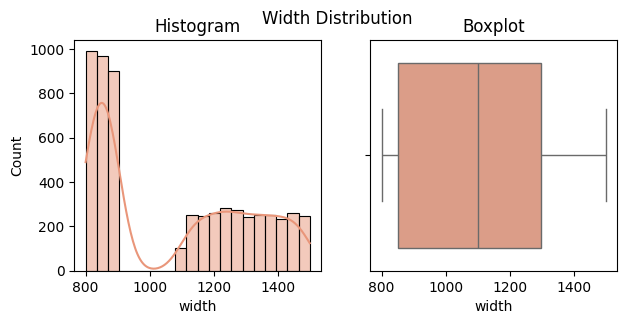

In [27]:
plot_distribution(train_dimension_df, 'width', 'Width', 'darksalmon')

As seen in the visualization, the width of the images follows a rather normal distribution. The majority of image widths fall in range of 800 to 1500 pixels, which is considered sufficient and decent for training purposes.

### Height Distribution

In [28]:
train_dimension_df['height'].describe().to_frame().T

,count,mean,std,min,25%,50%,75%,max
height,5760.0,806.66441,179.577154,600.0,638.0,825.5,974.0,1125.0


We observe that the mean height of the images is 806.66441 pixels, with the smallest height among the images being 600 pixels and the largest height 1125 pixels. This significant difference further supports the indication of a wide variation in the resolutions of the image dataset.

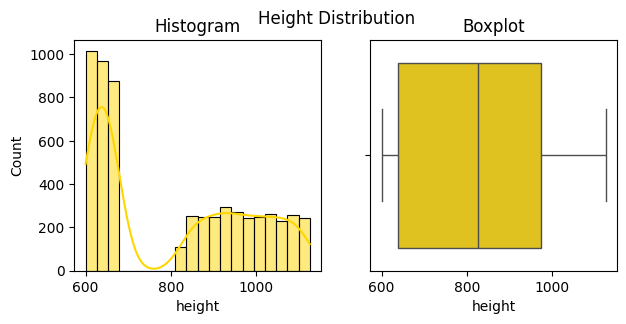

In [29]:
plot_distribution(train_dimension_df, 'height', 'Height', 'gold')

As seen in the visualization, the height of the images follows a rather normal distribution. The majority of image heights fall in range of 600 to 1125 pixels, which is considered sufficient and decent for training purposes.

## Display Images

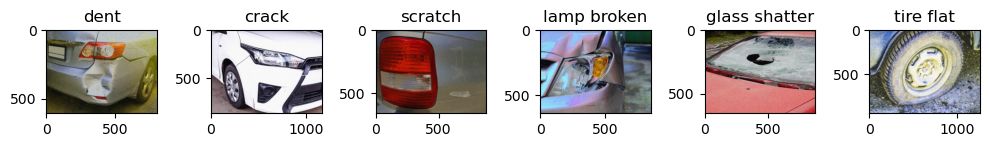

In [16]:
# Show preview images in each category

fig, axes = plt.subplots(ncols=6, nrows=1, figsize=(10,10))

# Iterate for every axes
for i in range(len(labels)):
    label = labels[i]
    img = plt.imread(train_files_dict[f'{label}_train_files'][i])
    axes[i].imshow(img)
    axes[i].set_title(label)


fig.tight_layout()
plt.show()

We've successfully displayed the image data. We can see that the dataset consists of a multitude of variations such as different angles, color palettes, individual or clustered flowers, and varying levels of zoom present across the images.

## Save EDA Dataframe

In [31]:
# Saving the dataframe
train_dimension_df.to_csv('deployment/content/dimension.csv', index=False)
train_img_df.to_csv('deployment/content/img.csv', index=False)

# **Feature Engineering**

## Split Train, Validation, and Test Set

In [32]:
# Randomize the order of the train data
train_df = train_img_df.sample(len(train_img_df)).reset_index(drop=True)

train_df

,images,label,size_kb,dimensions
0,./train/glass shatter/glass shatter_665.jpg,glass shatter,135.069,"(1254, 940)"
1,./train/tire flat/tire flat_241.jpg,tire flat,61.441,"(897, 672)"
2,./train/dent/dent_984.jpg,dent,107.483,"(1162, 871)"
3,./train/tire flat/tire flat_313.jpg,tire flat,65.213,"(846, 634)"
4,./train/crack/crack_074.jpg,crack,105.329,"(1376, 1032)"
...,...,...,...,...
5755,./train/scratch/scratch_599.jpg,scratch,100.850,"(1122, 841)"
5756,./train/scratch/scratch_1123.jpg,scratch,70.810,"(872, 654)"
5757,./train/lamp broken/lamp broken_484.jpg,lamp broken,86.907,"(859, 644)"
5758,./train/dent/dent_057.jpg,dent,51.843,"(832, 624)"


We've successfully shuffle the order of the train data before splitting.

In [33]:
# Randomize the order of the test data
test_df = test_img_df.sample(len(test_img_df)).reset_index(drop=True)

test_df

,images,label
0,./test/scratch/scratch_355.jpg,scratch
1,./test/dent/dent_216.jpg,dent
2,./test/dent/dent_015.jpg,dent
3,./test/scratch/scratch_013.jpg,scratch
4,./test/scratch/scratch_025.jpg,scratch
...,...,...
1435,./test/scratch/scratch_021.jpg,scratch
1436,./test/tire flat/tire flat_085.jpg,tire flat
1437,./test/scratch/scratch_466.jpg,scratch
1438,./test/scratch/scratch_388.jpg,scratch


We've successfully shuffle the order of the test data before splitting.

In [34]:
# Split into train and val set
train_df, val_df = train_test_split(train_img_df, test_size=0.3, random_state=123, stratify=train_img_df['label'])

print(f'Train shape: {train_df.shape}')
print(f'Val shape: {val_df.shape}')
print(f'Test shape: {test_df.shape}')

Train shape: (4032, 4)
Val shape: (1728, 4)
Test shape: (1440, 2)


We've successfully splitted the data into train, test, and validation sets.

In [35]:
# Get label proportion for each sets
labels, counts_train = label_proportion(train_df)
labels, counts_val = label_proportion(val_df)
labels, counts_test = label_proportion(test_df)

# Save the label proportion into a dataframe
label_proportion_df = pd.DataFrame({
    'label': labels,
    'train': counts_train,
    'val': counts_val,
    'test': counts_test,
})

label_proportion_df

,label,train,val,test
0,scratch,1315,564,470
1,dent,1164,499,416
2,glass shatter,664,284,237
3,lamp broken,494,212,176
4,tire flat,299,128,107
5,crack,96,41,34


We can see that the proportion for each labels in train, test, and validation sets are imbalanced, aligning with the distribution label proportion seen earlier.

## Image Data Generator

Found 4032 validated image filenames belonging to 6 classes.
Indices: {'crack': 0, 'dent': 1, 'glass shatter': 2, 'lamp broken': 3, 'scratch': 4, 'tire flat': 5}


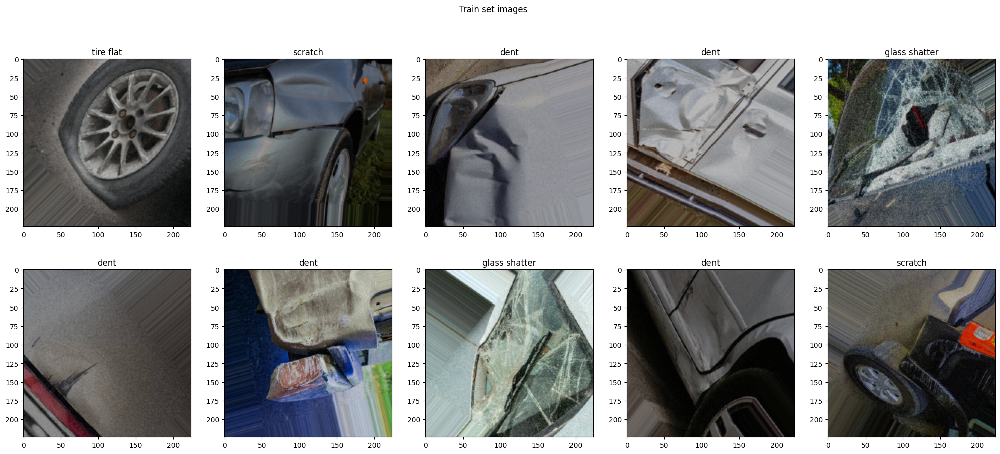

In [64]:
# Train Image Data Generator
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
  rescale=1./255.,
  horizontal_flip=True,
  rotation_range=120,
  brightness_range=[0.5, 1.5],
  width_shift_range=0.2,
  height_shift_range=0.2,
  shear_range=0.2,
  zoom_range=0.2,
)

# Flow from dataframe
train_gen = train_datagen.flow_from_dataframe(
	  train_df,
    x_col='images',
    y_col='label',
    target_size=(224, 224),
	  class_mode='categorical',
	  shuffle=False
)

label_indices = train_gen.class_indices
classes= list(label_indices.keys())

print(f'Indices: {label_indices}')

# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img, label = train_gen.next()
    idx = np.argmax(label, axis=1)  # Get the index of the maximum value in each label
    class_names = [classes[i] for i in idx]  # Get the class names for the corresponding indices

    # Display the image along with its label
    ax[i][j].imshow(img[0])
    ax[i][j].set_title(class_names[0])

fig.suptitle('Train set images')
plt.show()

Now, we generate the image for train using the ImageDataGenerator. We've successfully augmented the image and displayed the images in the train set.

Found 1728 validated image filenames belonging to 6 classes.
Indices: {'crack': 0, 'dent': 1, 'glass shatter': 2, 'lamp broken': 3, 'scratch': 4, 'tire flat': 5}


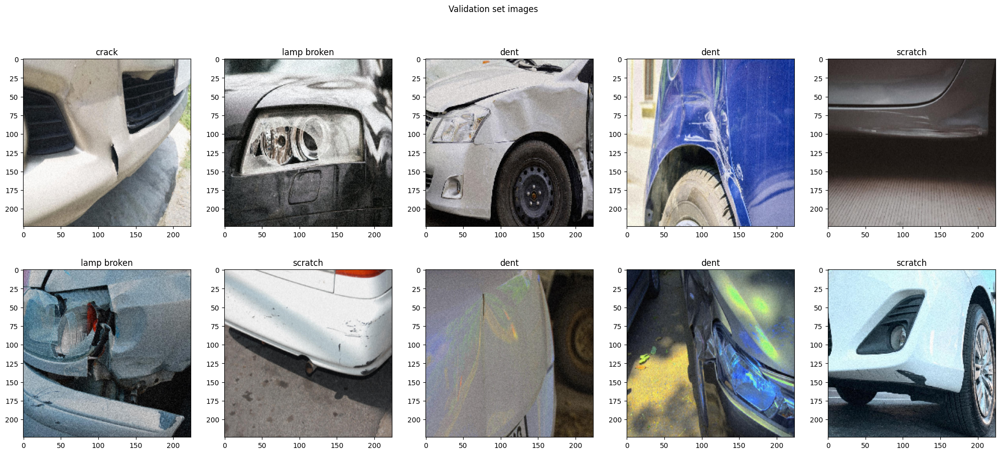

In [43]:
# Validation Image Data Generator
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# Flow from dataframe
val_gen = val_datagen.flow_from_dataframe(
	val_df,
    x_col='images',
    y_col='label',
    target_size=(224, 224),
	class_mode='categorical',
	shuffle=False
)

label_indices = val_gen.class_indices
classes= list(label_indices.keys())

print(f'Indices: {label_indices}')

# Show images of val-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img, label = val_gen.next()
    idx = np.argmax(label, axis=1)  # Get the index of the maximum value in each label
    class_names = [classes[i] for i in idx]  # Get the class names for the corresponding indices

    # Display the image along with its label
    ax[i][j].imshow(img[0])
    ax[i][j].set_title(class_names[0])

fig.suptitle('Validation set images')
plt.show()

Now, we generate the image for validation using the ImageDataGenerator. We've successfully rescaled the image and displayed the images in the validation set.

Found 1440 validated image filenames belonging to 6 classes.
Indices: {'crack': 0, 'dent': 1, 'glass shatter': 2, 'lamp broken': 3, 'scratch': 4, 'tire flat': 5}


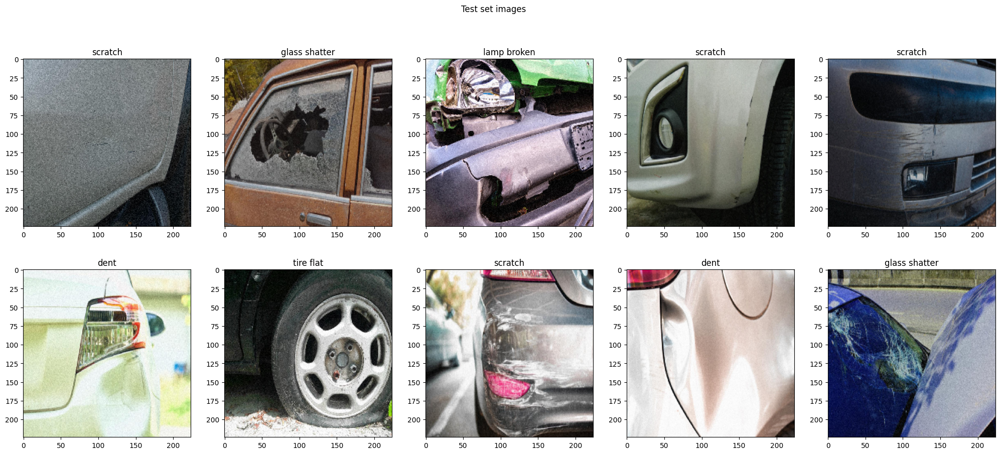

In [44]:
# Test Image Data Generator
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# Flow from dataframe
test_gen = test_datagen.flow_from_dataframe(
	  test_df,
    x_col='images',
    y_col='label',
    target_size=(224, 224),
	  class_mode='categorical',
	  shuffle=False
)

label_indices = test_gen.class_indices
classes= list(label_indices.keys())

print(f'Indices: {label_indices}')

# Show images of test-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img, label = test_gen.next()
    idx = np.argmax(label, axis=1)  # Get the index of the maximum value in each label
    class_names = [classes[i] for i in idx]  # Get the class names for the corresponding indices

    # Display the image along with its label
    ax[i][j].imshow(img[0])
    ax[i][j].set_title(class_names[0])

fig.suptitle('Test set images')
plt.show()

Now, we generate the image for test using the ImageDataGenerator. We've successfully rescaled the image and displayed the images in the test set.

# **Model I**

## Model Definition

In [45]:
# Load pre-trained VGG16 model without top classification layer
base_model_vgg16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

We've successfully loaded the pre-trained VGG16 model for transfer learning.

In [58]:
# Freeze pre-trained layers to prevent training
for layer in base_model_vgg16.layers:
    layer.trainable = False

# Create Sequential API
model_vgg16_1 = tf.keras.models.Sequential()
model_vgg16_1.add(base_model_vgg16)
model_vgg16_1.add(tf.keras.layers.Flatten())
model_vgg16_1.add(tf.keras.layers.Dense(256, activation='elu'))
model_vgg16_1.add(tf.keras.layers.Dropout(0.5))
model_vgg16_1.add(tf.keras.layers.Dense(6, activation='softmax'))

# Compile the model_vgg16_1
model_vgg16_1.compile(loss = 'categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

model_vgg16_1.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_8 (Flatten)         (None, 25088)             0         
                                                                 
 dense_16 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_8 (Dropout)         (None, 256)               0         
                                                                 
 dense_17 (Dense)            (None, 6)                 1542      
                                                                 
Total params: 21139014 (80.64 MB)
Trainable params: 6424326 (24.51 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


We've successfully defined the first model. The model is a Sequential CNN, consisting primarily of three main layers: Pre-trained Layers, Hidden Dense Layers, and the Output Layer. The pre-trained layers serve as convolutional layers, tasked to extract relevant features and capture spatial patterns. Hidden dense layers perform nonlinear transformations on the input data to learn complex relationships between features, enabling the network to make predictions. Essentially, the hidden layers calculate the weights of each relationship to optimize predictions. As stated earlier, we use the accuracy metrics only to track the fitting process.

## Model Training

In [65]:
# Train the model
history_vgg16_1 = model_vgg16_1.fit(
    train_gen,
    epochs=100,
    steps_per_epoch=50,
    validation_data=val_gen,
    verbose = 1,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)]
)

Epoch 1/100
50/50 [==============================] - 46s 924ms/step - loss: 1.2334 - accuracy: 0.5031 - val_loss: 0.9037 - val_accuracy: 0.6487
Epoch 2/100
50/50 [==============================] - 45s 911ms/step - loss: 1.1978 - accuracy: 0.5194 - val_loss: 0.8375 - val_accuracy: 0.6840
Epoch 3/100
50/50 [==============================] - 45s 900ms/step - loss: 1.1983 - accuracy: 0.5181 - val_loss: 0.8715 - val_accuracy: 0.6719
Epoch 4/100
50/50 [==============================] - 45s 904ms/step - loss: 1.1520 - accuracy: 0.5437 - val_loss: 0.8397 - val_accuracy: 0.6678
Epoch 5/100
50/50 [==============================] - 44s 882ms/step - loss: 1.1933 - accuracy: 0.5250 - val_loss: 0.8199 - val_accuracy: 0.6823
Epoch 6/100
50/50 [==============================] - 45s 896ms/step - loss: 1.1558 - accuracy: 0.5275 - val_loss: 0.8964 - val_accuracy: 0.6296
Epoch 7/100
50/50 [==============================] - 45s 911ms/step - loss: 1.2065 - accuracy: 0.4888 - val_loss: 0.8857 - val_accuracy:

We've successfully trained the model with 100 epochs and 50 steps per epoch. Throughout the training process, we monitored the loss, accuracy, validation loss, and validation accuracy values for each epoch. Additionally, we implemented the early stopping callback, which will halt the training before reaching the 30th epoch if convergence criteria were met. And for this training, the criteria were met at the 10th epoch.

## Model Evaluation

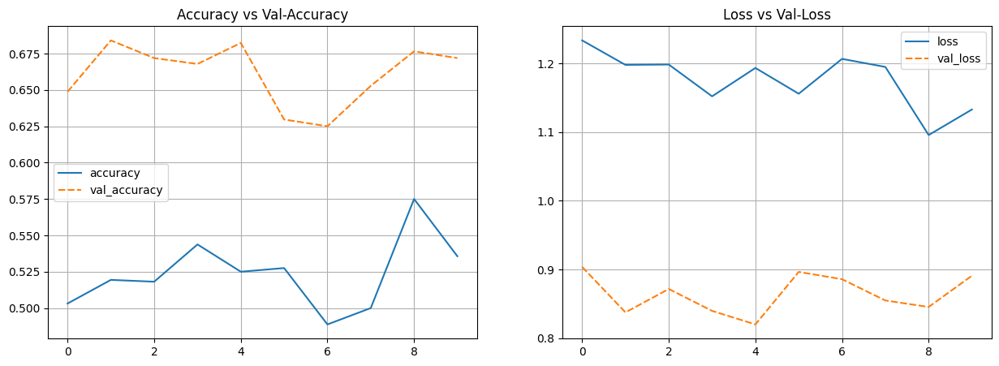

In [67]:
# Plot Training Results

history_vgg16_1_df = pd.DataFrame(history_vgg16_1.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_vgg16_1_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_vgg16_1_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')
plt.show()

Based on the visualization above, it is evident that the accuracy score obtained from the validation set surpass those from the training set. This disparity is presumed to occur due to the relatively small dataset size, allowing the model to predict more accurately.

In [68]:
# Evaluate the Model_vgg16_1 with Train sets
loss_train, accuracy_train = model_vgg16_1.evaluate(train_gen)

# Print the evaluation results
print('Train Loss:', round(loss_train, 4))
print('Train accuracy:', round(accuracy_train, 4))
print('-' * 50)

# Evaluate the Model_vgg16_1 with Validation sets
loss_val, accuracy_val = model_vgg16_1.evaluate(val_gen)

# Print the evaluation results
print('Validation Loss:', round(loss_val, 4))
print('Validation accuracy:', round(accuracy_val, 4))
print('-' * 50)

# Evaluate the Model_vgg16_1 with Test sets
loss_test, accuracy_test = model_vgg16_1.evaluate(test_gen)

# Print the evaluation results
print('Test Loss:', round(loss_test, 4))
print('Test accuracy:', round(accuracy_test, 4))
print('-' * 50)

126/126 [==============================] - 81s 645ms/step - loss: 0.9837 - accuracy: 0.6111
Train Loss: 0.9837
Train accuracy: 0.6111
--------------------------------------------------
54/54 [==============================] - 17s 305ms/step - loss: 0.8909 - accuracy: 0.6719
Validation Loss: 0.8909
Validation accuracy: 0.6719
--------------------------------------------------
45/45 [==============================] - 19s 425ms/step - loss: 0.8767 - accuracy: 0.6542
Test Loss: 0.8767
Test accuracy: 0.6542
--------------------------------------------------


Looking at the scores obtained in each set, the model performs quite similarly. As we can see, the model has a rather poor to moderate performance from 65-67% with the loss score from 0.88-0.89. These results indicate that the model is still undefitting, as it still struggles to search for the general pattern for each data. Despite this underfitting, the model performance falls rather on a quite moderate performance. 

45/45 [==============================] - 15s 329ms/step
               precision    recall  f1-score   support

        crack       0.00      0.00      0.00        34
         dent       0.68      0.44      0.53       416
glass shatter       0.69      0.93      0.79       237
  lamp broken       0.49      0.73      0.59       176
      scratch       0.65      0.68      0.67       470
    tire flat       0.93      0.86      0.89       107

     accuracy                           0.65      1440
    macro avg       0.57      0.61      0.58      1440
 weighted avg       0.65      0.65      0.64      1440



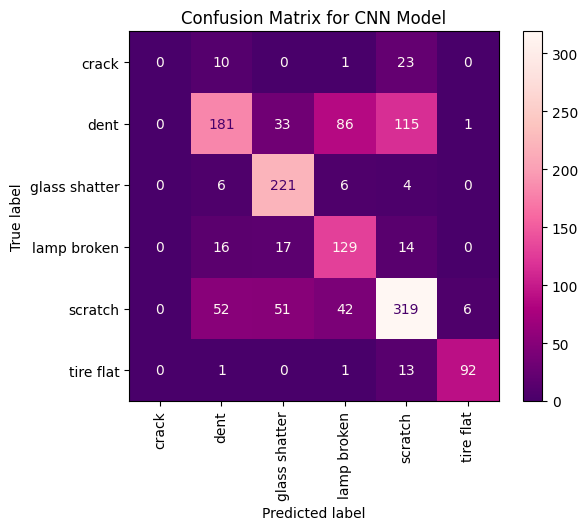

In [69]:
# Make predictions
predictions_vgg16_1 = model_vgg16_1.predict(test_gen)

# Get the predicted class labels
predicted_labels_vgg16_1 = np.argmax(predictions_vgg16_1, axis=1)

target = ['crack', 'dent', 'glass shatter', 'lamp broken', 'scratch', 'tire flat']
print(classification_report(test_gen.labels, predicted_labels_vgg16_1, target_names = target))

# Compute confusion matrix
conf_matrix = confusion_matrix(test_gen.labels, predicted_labels_vgg16_1)
display = ConfusionMatrixDisplay(conf_matrix, display_labels=list(test_gen.class_indices.keys()))
display.plot(cmap='RdPu_r')
plt.title('Confusion Matrix for CNN Model')
plt.xticks(rotation=90)

plt.show()

We observe that the overall accuracy for this model is 65% which is still considered poor to moderate performance. As we can see, the model struggles to identify the crack label. We assume that this occurs because the train set is small indicating the model is bias towards the biggest label. We can see from the recall score that the model thrived in predicting tire flat and glass shatter. We also assume that it's logical for the model to struggles in classifying the crack, scratch, and dent damages because in real life the three damage occurs together. 

# **Model II**

## Model Definition

In [74]:
# Freeze pre-trained layers to prevent training
for layer in base_model_vgg16.layers:
    layer.trainable = False

# Create Sequential API
model_vgg16_2 = tf.keras.models.Sequential()
model_vgg16_2.add(base_model_vgg16)
model_vgg16_2.add(tf.keras.layers.Flatten())
model_vgg16_2.add(tf.keras.layers.Dense(256, activation='elu'))
model_vgg16_2.add(tf.keras.layers.Dropout(0.2))
model_vgg16_2.add(tf.keras.layers.Dense(128, activation='elu'))
model_vgg16_2.add(tf.keras.layers.Dropout(0.2))
model_vgg16_2.add(tf.keras.layers.Dense(6, activation='softmax'))

# Compile the model_vgg16_2
model_vgg16_2.compile(loss = 'categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])

model_vgg16_2.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_11 (Flatten)        (None, 25088)             0         
                                                                 
 dense_22 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_11 (Dropout)        (None, 256)               0         
                                                                 
 dense_23 (Dense)            (None, 128)               32896     
                                                                 
 dropout_12 (Dropout)        (None, 128)               0         
                                                                 
 dense_24 (Dense)            (None, 6)               

We've successfully defined the second model, which is also a Sequential Convolutional Neural Network (CNN). Like the first model, it comprises three main layers: Pre-trained Layers, Hidden Dense Layers, and the Output Layer. However, this model introduces a new Hidden Dense Layer to capture sequential patterns within the data. Additionally, we've reduced the dropout rate to 0.2 to retain more neurons that may possess untapped potential for computation. Similar to the first model, we continue to utilize accuracy metrics solely to monitor the fitting process.

## Model Training

In [75]:
# Train the model
history_vgg16_2 = model_vgg16_2.fit(
    train_gen,
    epochs=100,
    steps_per_epoch=50,
    validation_data=val_gen,
    verbose = 1,
    callbacks=[tf.keras.callbacks.EarlyStopping(patience=5)]
)

Epoch 1/100
50/50 [==============================] - 49s 917ms/step - loss: 2.7048 - accuracy: 0.2937 - val_loss: 1.2595 - val_accuracy: 0.4797
Epoch 2/100
50/50 [==============================] - 44s 894ms/step - loss: 1.5432 - accuracy: 0.3919 - val_loss: 1.0785 - val_accuracy: 0.5538
Epoch 3/100
50/50 [==============================] - 44s 888ms/step - loss: 1.4115 - accuracy: 0.4431 - val_loss: 1.0875 - val_accuracy: 0.5787
Epoch 4/100
50/50 [==============================] - 44s 895ms/step - loss: 1.3113 - accuracy: 0.4594 - val_loss: 0.9886 - val_accuracy: 0.6100
Epoch 5/100
50/50 [==============================] - 44s 889ms/step - loss: 1.3226 - accuracy: 0.4481 - val_loss: 0.9711 - val_accuracy: 0.6001
Epoch 6/100
50/50 [==============================] - 53s 1s/step - loss: 1.2774 - accuracy: 0.4825 - val_loss: 0.9803 - val_accuracy: 0.5816
Epoch 7/100
50/50 [==============================] - 45s 904ms/step - loss: 1.2273 - accuracy: 0.5000 - val_loss: 1.0607 - val_accuracy: 0.

We've successfully trained the model with 100 epochs and 50 steps per epoch. Throughout the training process, we monitored the loss, accuracy, validation loss, and validation accuracy values for each epoch. Additionally, we implemented the early stopping callback, which will halt the training before reaching the 30th epoch if convergence criteria were met. And for this training, the criteria were met at the 31st epoch.

## Model Evaluation

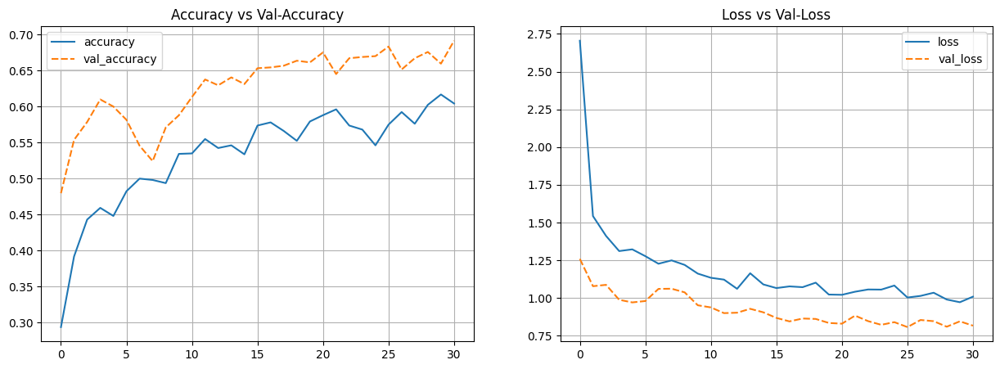

In [76]:
# Plot Training Results

history_vgg16_2_df = pd.DataFrame(history_vgg16_2.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_vgg16_2_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_vgg16_2_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')
plt.show()

Based on the visualization above, it is evident that the accuracy score obtained from the validation set surpass those from the training set. This disparity is presumed to occur due to the relatively small dataset size, allowing the model to predict more accurately. In comparison to the first model, we can see that the validation accuracy almost reaching 70% in performance which means the model has the potential to surpass 70% and will get a moderate performance.

In [77]:
# Evaluate the Model_vgg16_2 with Train sets
loss_train, accuracy_train = model_vgg16_2.evaluate(train_gen)

# Print the evaluation results
print('Train Loss:', round(loss_train, 4))
print('Train Accuracy:', round(accuracy_train, 4))
print('-' * 50)

# Evaluate the Model_vgg16_2 with Validation sets
loss_val, accuracy_val = model_vgg16_2.evaluate(val_gen)

# Print the evaluation results
print('Validation Loss:', round(loss_val, 4))
print('Validation Accuracy:', round(accuracy_val, 4))
print('-' * 50)

# Evaluate the Model_vgg16_2 with Test sets
loss_test, accuracy_test = model_vgg16_2.evaluate(test_gen)

# Print the evaluation results
print('Test Loss:', round(loss_test, 4))
print('Test Accuracy:', round(accuracy_test, 4))
print('-' * 50)

126/126 [==============================] - 83s 657ms/step - loss: 0.9023 - accuracy: 0.6421
Train Loss: 0.9023
Train Accuracy: 0.6421
--------------------------------------------------
54/54 [==============================] - 13s 233ms/step - loss: 0.8170 - accuracy: 0.6916
Validation Loss: 0.817
Validation Accuracy: 0.6916
--------------------------------------------------
45/45 [==============================] - 11s 239ms/step - loss: 0.8242 - accuracy: 0.6833
Test Loss: 0.8242
Test Accuracy: 0.6833
--------------------------------------------------


Looking at the scores obtained in each set, the model performs quite similarly. As we can see, the model still has a rather poor to moderate performance from 68-69% with the loss score from 0.81-0.82. These results indicate that the model is still underfitting, as it still struggles to search for the general pattern for each data. Despite this underfitting, the second model performance is better in performance and loss than the first model.

45/45 [==============================] - 9s 201ms/step
               precision    recall  f1-score   support

        crack       0.00      0.00      0.00        34
         dent       0.62      0.66      0.64       416
glass shatter       0.72      0.93      0.81       237
  lamp broken       0.69      0.50      0.58       176
      scratch       0.68      0.64      0.66       470
    tire flat       0.83      0.93      0.88       107

     accuracy                           0.68      1440
    macro avg       0.59      0.61      0.59      1440
 weighted avg       0.67      0.68      0.67      1440



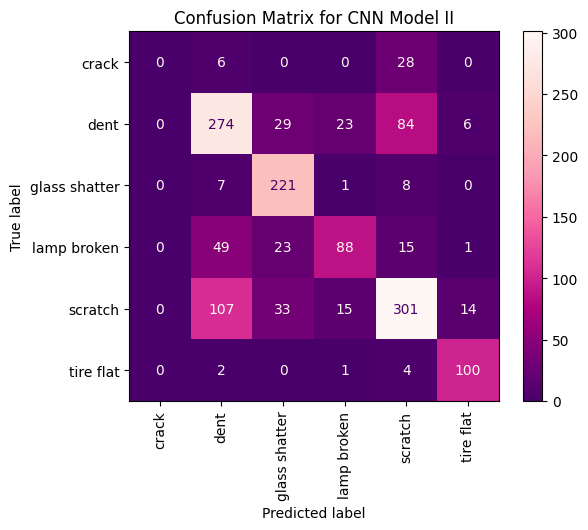

In [78]:
# Make predictions
predictions_vgg16_2 = model_vgg16_2.predict(test_gen)

# Get the predicted class labels
predicted_labels_vgg16_2 = np.argmax(predictions_vgg16_2, axis=1)

target = ['crack', 'dent', 'glass shatter', 'lamp broken', 'scratch', 'tire flat']
print(classification_report(test_gen.labels, predicted_labels_vgg16_2, target_names = target))

# Compute confusion matrix
conf_matrix = confusion_matrix(test_gen.labels, predicted_labels_vgg16_2)
display = ConfusionMatrixDisplay(conf_matrix, display_labels=list(test_gen.class_indices.keys()))
display.plot(cmap='RdPu_r')
plt.title('Confusion Matrix for CNN Model II')
plt.xticks(rotation=90)

plt.show()

We observe that the overall accuracy for this model is 68% which is still considered moderate performance. As we can see, the model still struggles to identify the crack label. We assume that this occurs because the train set is small indicating the model is bias towards the biggest label. We can see from the recall score that the model thrived in predicting tire flat and glass shatter. We also assume that it's logical for the model to struggles in classifying the crack, scratch, and dent damages because in real life the three damage occurs together. But in this model, we observe the recall score is now better. The issue is the model now struggles to identify lamp broken and mostly predicting it as dent.

# **Model Saving**

In [79]:
# Save the best model
model_vgg16_2.save('deployment/tf_vgg16_model_2.h5')

Based on the evaluation of the two model, the best performing model is the second sequential model. It has an accuracy score of 68% and loss score of 0.82. One drawbacks of the model is that the model is underfits but it's still acceptable as the current performance still considered a rather moderate performance.

# **Model Inference**

In [8]:
# Load Model
model = tf.keras.models.load_model('tf_vgg16_model_2.h5')

model

In [15]:
# Loading the files path
inf_files = glob.glob('./inf/*')

inf_df = pd.DataFrame({
    'images': inf_files
})

inf_df

,images
0,./inf/c1yldi7wskg51.jpg
1,./inf/Why-Can’t-I-Just-Do-Paintless-Dent-Remov...
2,./inf/Dynamic+Dent+-+Oct+1.jpeg
3,./inf/iStock-183290483.jpg


In [16]:
# Inference Image Data Generator
inf_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

# Flow from dataframe
inf_gen = inf_datagen.flow_from_dataframe(
	inf_df,
  x_col='images',
  y_col=None,
  target_size=(224, 224),
	class_mode=None,
	shuffle=False
)

Found 4 validated image filenames.


In [17]:
predictions = model.predict(inf_gen)

predictions

1/1 [==============================] - 1s 760ms/step


array([[7.03768581e-02, 1.37992725e-01, 5.42191369e-03, 2.94573531e-02,
        7.12510347e-01, 4.42407914e-02],
       [1.58810988e-02, 8.16661835e-01, 2.52633914e-03, 3.42762619e-02,
        1.30371571e-01, 2.82892841e-04],
       [3.57848592e-02, 1.08861126e-01, 1.43894358e-04, 5.61894150e-03,
        6.35754228e-01, 2.13836968e-01],
       [3.60145932e-05, 1.28844508e-03, 9.97382820e-01, 1.36631134e-04,
        1.14971481e-03, 6.36652703e-06]], dtype=float32)

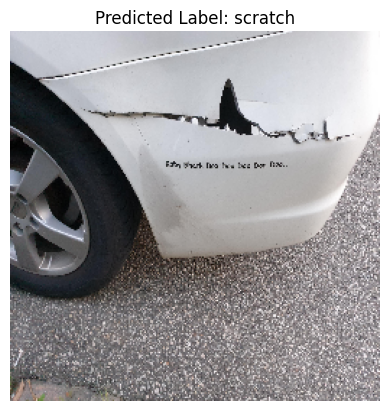

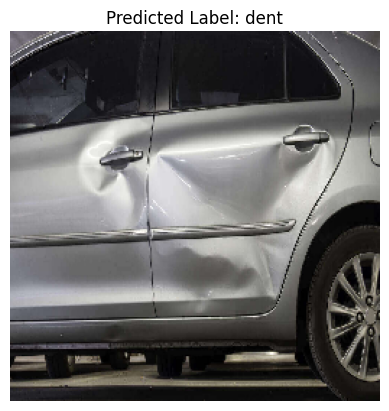

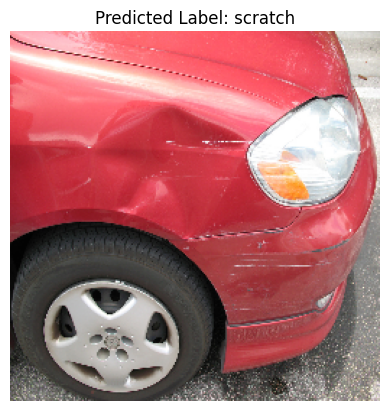

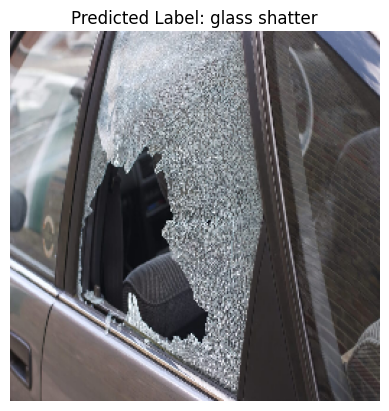

In [18]:
# Convert the predicted probabilities to class labels
predicted_labels = np.argmax(predictions, axis=1)
labels = ['crack', 'dent', 'glass shatter', 'lamp broken', 'scratch', 'tire flat']

# Display the images along with their predicted labels
for i in range(len(predicted_labels)):
    # Load the image
    img_path = inf_df.iloc[i]['images']
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256))

    # Display the image
    plt.imshow(img)
    plt.axis('off')

    # Get the predicted label
    predicted_label = labels[predicted_labels[i]]

    # Display the predicted label
    plt.title(f'Predicted Label: {predicted_label}')

    # Show the image with the predicted label
    plt.show()

The model can now predict inference data.

# **Conclusion**

- **EDA**  
The image dataset consists of six vehicle damage labels: crack, dent, glass shatter, lamp broken, scratch, and tire flat. The distribution of the labels is imbalance with the scratch label took the biggest proportion (32.6%) and the crack label took the smallest proportion of merely 2.4%. The extensive difference between the biggest and smallest proportion may lead to a bias model. Image sizes in the dataset vary considerably, with quite a difference between the minimum and maximum sizes. However, both small and large images lack distinct characteristics, suggesting that the variation is primarily due to image resolution. The mean width and height of the images are 1076.043 pixels and 806.664 pixels, respectively, which are sufficient for training purposes. The images dataset varies in angles and color palette. However, a limitation of the dataset is that vehicle damage is often associated with multiple labels. Consequently, constructing an accurate predictive model presents challenges due to this inherent complexity.

- **Model**  
The second sequential model is chosen as the best-performing model, achieving an accuracy score of 68% and a loss score of approximately 0.82. Although the model still considered underfit, the performance is considered a moderate performance. The model is also quite stable as the difference of performance seen in train, validation, and test set are not that significant. The model excels at predicting glass shatter and tire flat labels due to the distinct characteristics. However, it continues to face challenges in predicting other labels, as vehicle damage often presents with multiple labels. Despite these limitations, the model's overall performance underscores its potential utility in the classification task.

- **Further Improvement**  
To enhance the model performance further, additional models could be trained with different parameters or CNN structures. We can also improve the model by improving the dataset as the label proportion is currently has a severe imbalance. We can augment the dataset with more diverse images as it could also enhance the model's ability to generalize and predict a broader range of images accurately. Given the nature of vehicle damage often involving multiple labels, adapting the model to predict images with multiple labels is another avenue for improvement. This could involve modifying the model architecture to output probability distributions over multiple labels, enabling it to capture complex relationships between damage types.